----------------------------------------
## 🌾 Project: Global Wheat Detection (GWHD 2020)
## Module 03: Basic Exploratory Data Analysis (EDA)
*Objective:* Audit the 6.6 GB research dataset to ensure data integrity before splitting for training.
----------------------------------------

In [113]:
import os
import cv2
import math 
import json 
import random
import numpy as np 
import pandas as pd  
import seaborn as sns
from pathlib import Path 
import matplotlib.pyplot as plt

Importing neccesary libraries

In [99]:
PROJECT_ROOT = Path.cwd().parent  # if notebook is in /notebooks
df = pd.read_csv(PROJECT_ROOT / "data" / "raw" / "master_metadata.csv")

Reading the data

In [100]:
print(df.shape)
df.head(10)

(3422, 8)


,image_id,coco_image_id,source,path,width,height,bbox_count,boxes
0,1f285777-a10d-460c-8bb2-a6b7a352c580,430,arvalis_1,data/raw/gwhd2020\arvalis_1\1f285777-a10d-460c...,1024,1024,26,"[[803, 855, 89, 119], [415, 636, 230, 186], [5..."
1,1efd0517-bdab-4bb0-9683-cb3a7076fe6e,532,arvalis_1,data/raw/gwhd2020\arvalis_1\1efd0517-bdab-4bb0...,1024,1024,56,"[[798, 226, 57, 50], [940, 655, 69, 110], [314..."
2,08a2f1eb-6e2e-4496-abaa-ed9ce20b3251,1573,arvalis_1,data/raw/gwhd2020\arvalis_1\08a2f1eb-6e2e-4496...,1024,1024,41,"[[835, 0, 53, 52], [694, 365, 250, 73], [294, ..."
3,0646dee8-63a4-44c7-adc5-48495cc197c6,1574,arvalis_1,data/raw/gwhd2020\arvalis_1\0646dee8-63a4-44c7...,1024,1024,26,"[[646, 548, 80, 85], [727, 497, 148, 143], [19..."
4,55065bf8-7c66-4342-9b51-f76308d352de,1575,arvalis_1,data/raw/gwhd2020\arvalis_1\55065bf8-7c66-4342...,1024,1024,39,"[[742, 907, 65, 72], [575, 630, 90, 57], [662,..."
5,22bd724b-257e-415b-890f-80f9a52d4067,1576,arvalis_1,data/raw/gwhd2020\arvalis_1\22bd724b-257e-415b...,1024,1024,60,"[[868, 904, 86, 34], [377, 153, 77, 63], [253,..."
6,1ec52c88-3f67-4ec6-851f-efe1aceadc87,1577,arvalis_1,data/raw/gwhd2020\arvalis_1\1ec52c88-3f67-4ec6...,1024,1024,53,"[[467, 861, 57, 59], [88, 67, 41, 56], [873, 8..."
7,4af5609c-182a-488f-8151-c381425e2cc4,1578,arvalis_1,data/raw/gwhd2020\arvalis_1\4af5609c-182a-488f...,1024,1024,44,"[[320, 655, 56, 48], [185, 150, 49, 54], [714,..."
8,3b68f79b-a659-4747-91ae-3e6d82c71171,1579,arvalis_1,data/raw/gwhd2020\arvalis_1\3b68f79b-a659-4747...,1024,1024,47,"[[0, 977, 69, 47], [318, 457, 65, 126], [130, ..."
9,45f0529c-89cd-47ae-950b-e4edd5bfe982,1580,arvalis_1,data/raw/gwhd2020\arvalis_1\45f0529c-89cd-47ae...,1024,1024,38,"[[510, 856, 158, 91], [899, 617, 55, 83], [964..."


First sight to data

In [101]:
print(f"✅ Total Images: {len(df)}")
print(f"✅ Total Wheat Heads: {df['bbox_count'].sum()}")
print(f"✅ Sources found: {df['source'].unique()}")

✅ Total Images: 3422
✅ Total Wheat Heads: 145411
✅ Sources found: <StringArray>
['arvalis_1', 'arvalis_2', 'arvalis_3', 'ethz_1', 'inrae_1', 'rres_1',
 'usask_1']
Length: 7, dtype: str


Moderate amount of images to train, also different sources for images ensuring different kinds of images

In [102]:
df.info()

<class 'pandas.DataFrame'>
RangeIndex: 3422 entries, 0 to 3421
Data columns (total 8 columns):
 #   Column         Non-Null Count  Dtype
---  ------         --------------  -----
 0   image_id       3422 non-null   str  
 1   coco_image_id  3422 non-null   int64
 2   source         3422 non-null   str  
 3   path           3422 non-null   str  
 4   width          3422 non-null   int64
 5   height         3422 non-null   int64
 6   bbox_count     3422 non-null   int64
 7   boxes          3422 non-null   str  
dtypes: int64(4), str(4)
memory usage: 214.0 KB


In [103]:
df.columns

Index(['image_id', 'coco_image_id', 'source', 'path', 'width', 'height',
       'bbox_count', 'boxes'],
      dtype='str')

In [104]:
df.isnull().sum()

image_id         0
coco_image_id    0
source           0
path             0
width            0
height           0
bbox_count       0
boxes            0
dtype: int64

In [105]:
df.duplicated().sum()

np.int64(0)

In [106]:
df.describe()

,coco_image_id,width,height,bbox_count
count,3422.000000,3422.0,3422.0,3422.000000
mean,2683.045003,1024.0,1024.0,42.492987
std,1193.945813,0.0,0.0,20.100735
min,31.000000,1024.0,1024.0,0.000000
25%,1904.250000,1024.0,1024.0,27.000000
50%,2759.500000,1024.0,1024.0,42.000000
75%,3614.750000,1024.0,1024.0,57.000000
max,4750.000000,1024.0,1024.0,112.000000


Basic description for the data

### 📊 Data Profile & Integrity
| Metric | Result | Insight |
| :--- | :--- | :--- |
| **Total Images** | 3,422 | Sufficient amount for Transfer Learning. |
| **Total Wheat Heads** | [145,411] | High-density dataset. |
| **Missing Values** | 0 | Dataset is clean; no imputation needed. |
| **Duplicate IDs** | 0 | No risk of data leakage. |
| **Resolution** | 1024 x 1024 | Uniform sizing; simplifies preprocessing. |

In [107]:
df.nunique()

image_id         3422
coco_image_id    3422
source              7
path             3422
width               1
height              1
bbox_count        103
boxes            3377
dtype: int64

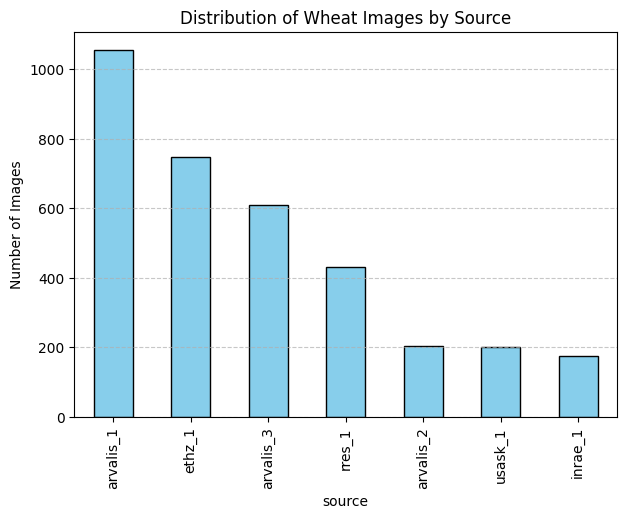

In [108]:
plt.figure(figsize=(7, 5))
df['source'].value_counts().plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Distribution of Wheat Images by Source')
plt.ylabel('Number of Images')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

### Dataset Sources and Their Countries

The images in the dataset were collected by several research institutions around the world.  
Each **source** in the dataset corresponds to a specific institution and country where the wheat images were captured.

This geographical diversity introduces significant variability in the dataset, including differences in wheat varieties, environmental conditions, imaging equipment, and lighting.

| Source | Institution | Country Code | Country |
|------|-------------|-------------|--------|
| ARVALIS_1 / ARVALIS_2 / ARVALIS_3 | ARVALIS – Institut du végétal | FR | France |
| ETHZ_1 | ETH Zurich | CH | Switzerland |
| RRES_1 | Rothamsted Research | GB | United Kingdom |
| USASK_1 | University of Saskatchewan | CA | Canada |
| UTOKYO_1 / UTOKYO_2 | University of Tokyo | JP | Japan |
| NAU_1 | Nanjing Agricultural University | CN | China |
| UQ_1 | University of Queensland | AU | Australia |

The presence of images from multiple countries means the dataset captures a wide range of **agricultural environments and wheat characteristics**.  
As a result, any machine learning model trained on this dataset must be capable of **generalizing across diverse visual conditions**, including variations in plant appearance, density, and image quality.

We can see that much amount of images are coming from "arvalis_1", "ethz_1" etc.

<Axes: xlabel='bbox_count', ylabel='source'>

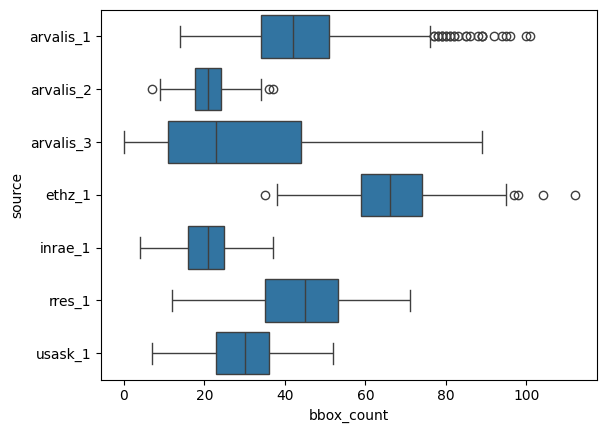

In [109]:
sns.boxplot(x = 'bbox_count', y = 'source', data = df)

Here is visible that average bbox_count is different for each of image source.We also have outliers in these sources - 'arvalis_1','arvalis_2','ethz_1'

<Axes: xlabel='bbox_count', ylabel='Count'>

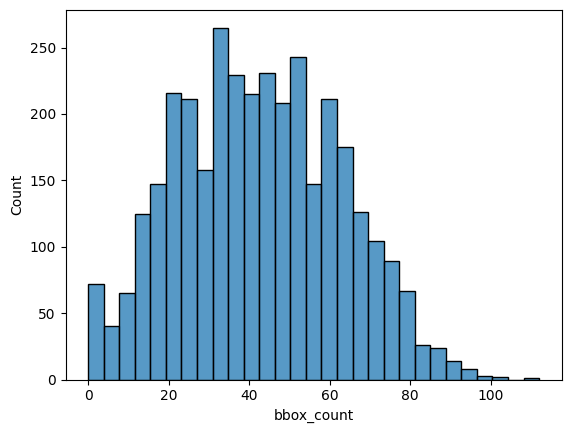

In [110]:
sns.histplot(df['bbox_count'])

bbox_count has quite good distribution even though there are outliers(images which haven't any bounding boxes (0), and the ones which have too many bounding boxes 100+) 

C:\Users\Home\AppData\Local\Temp\ipykernel_6328\3171397392.py:37: UserWarning: Glyph 128205 (\N{ROUND PUSHPIN}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
c:\Users\Home\Agriculture_Decision_System\venv\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 128270 (\N{RIGHT-POINTING MAGNIFYING GLASS}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\Home\Agriculture_Decision_System\venv\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 128205 (\N{ROUND PUSHPIN}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


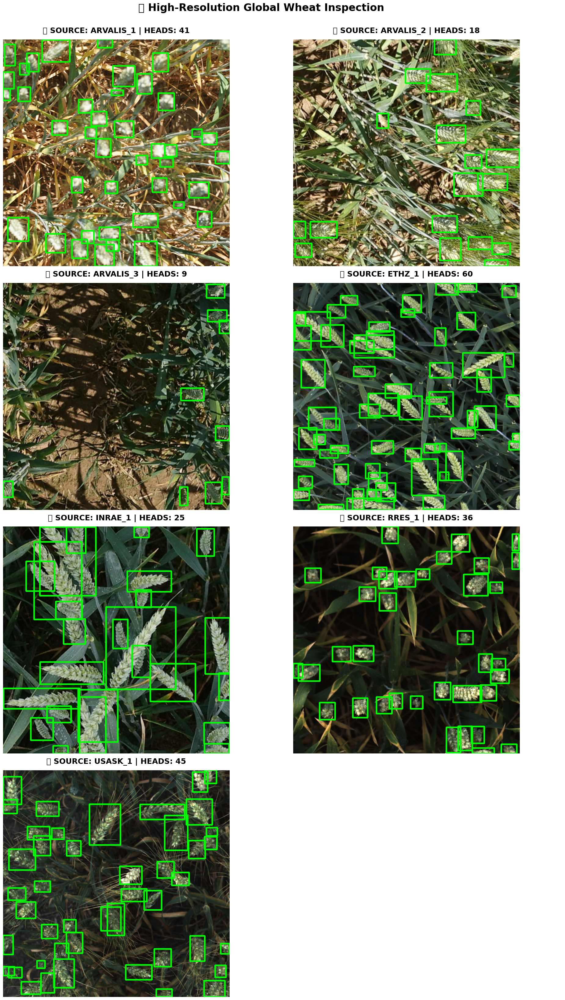

In [112]:
def visualize_global_high_res(df, n_sources=7):
    unique_sources = df['source'].unique()
    selected_sources = unique_sources[:n_sources]
    
    # Calculate grid dimensions (e.g., 4 rows, 2 columns for 7-8 images)
    cols = 2
    rows = math.ceil(n_sources / cols)
    
    # Massive figure size: 20 units wide, 8 units per row high
    fig, axes = plt.subplots(rows, cols, figsize=(20, 8 * rows))
    axes = axes.flatten() # Flatten to 1D array for easy indexing
    
    for i, source in enumerate(selected_sources):
        # Pick one random image from this source
        sample = df[df['source'] == source].sample(1).iloc[0]
        
        # Load and Convert
        img_path = os.path.join('..', sample['path'])
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        
        # Draw Bounding Boxes with a slightly thicker line for high-res
        boxes = json.loads(sample['boxes'])
        for box in boxes:
            x, y, w, h = [int(v) for v in box]
            cv2.rectangle(img, (x, y), (x+w, y+h), (0, 255, 0), 5)
            
        axes[i].imshow(img)
        axes[i].set_title(f"📍 SOURCE: {source.upper()} | HEADS: {sample['bbox_count']}", 
                          fontsize=18, fontweight='bold', pad=15)
        axes[i].axis('off')

    # Hide any empty subplots (if n_sources is odd)
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.suptitle("🔎 High-Resolution Global Wheat Inspection", fontsize=24, y=1.02, fontweight='black')
    plt.show()

# Execute the deep-dive
visualize_global_high_res(df, n_sources=7)

## **Visual Inspection of Images Across Sources**

To better understand the variability in the Global Wheat Head Detection Dataset, a visualization function was implemented.
This function randomly samples seven images from each source and displays them together with their corresponding bounding box annotations.

This step allows us to visually inspect the characteristics and differences between images originating from different sources.

### **Observations**

From the sampled images we can notice several important differences between sources:

Color variations of wheat plants and surrounding vegetation.
Differences in wheat head shape and size, which may depend on wheat variety or growth stage.
Variations in image quality, including lighting conditions, shadows, and camera characteristics.
Different field densities, meaning the number of wheat heads visible per image can vary significantly.
Background variability, such as soil visibility, leaf density, and plant orientation.

These variations suggest that the dataset contains images collected from different geographical locations and agricultural environments.

### **Implications for the Machine Learning Task**

The diversity observed in the dataset makes the problem more challenging from a machine learning perspective. A model trained on this data must be capable of handling significant visual variability across images.

In particular, the model needs to learn robust and generalizable features that allow it to detect wheat heads under different conditions, rather than overfitting to a specific field appearance or imaging setup.

Although the task can be framed as a standard object detection problem, the variability in the data introduces additional complexity that closely resembles real-world agricultural scenarios.

### **Practical Importance**

Accurate wheat head detection has practical value in agriculture. Reliable detection models can assist in automated crop monitoring, yield estimation, and agricultural research, helping farmers and researchers make more informed decisions.

Therefore, developing a model that performs well across diverse conditions is essential for building a practical and deployable solution.

#### **A model that only works in France is useless in Japan; We are building a "Global Citizen" AI.**

## **Checking outliers quality**

C:\Users\Home\AppData\Local\Temp\ipykernel_6328\3171397392.py:37: UserWarning: Glyph 128205 (\N{ROUND PUSHPIN}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
c:\Users\Home\Agriculture_Decision_System\venv\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 128270 (\N{RIGHT-POINTING MAGNIFYING GLASS}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\Home\Agriculture_Decision_System\venv\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 128205 (\N{ROUND PUSHPIN}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


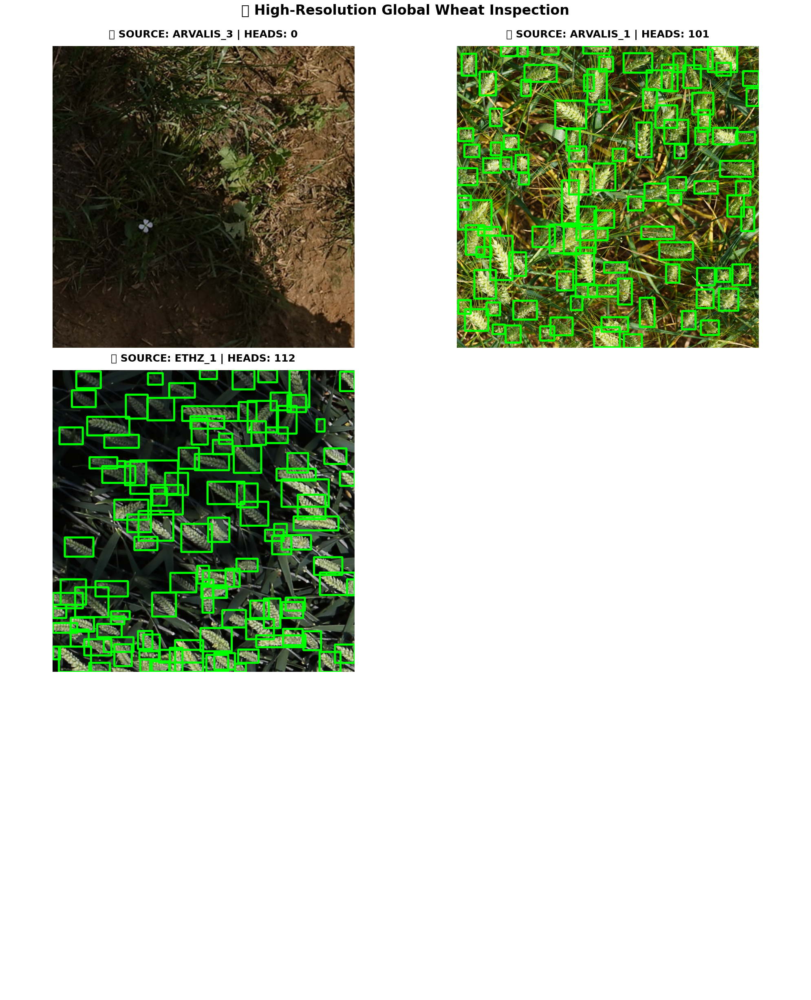

In [114]:
def audit_outliers(df, threshold=100):
    # 1. Grab the "Empty" images
    empty_samples = df[df['bbox_count'] == 0].sample(min(3, len(df[df['bbox_count']==0])))
    
    # 2. Grab the "Hyper-Crowded" images
    crowded_samples = df[df['bbox_count'] >= threshold].sample(min(3, len(df[df['bbox_count']>=threshold])))
    
    # 3. Combine and Plot
    audit_df = pd.concat([empty_samples, crowded_samples])
    
    # Use your high-res visualization function here
    visualize_global_high_res(audit_df, n_sources=len(audit_df))

audit_outliers(df)

## 🏁 Final Conclusion:

After a comprehensive exploration of the 3,422 images in the GWHD 2020 dataset, the following technical "Truths" have been established to guide the modeling phase:

### 1. The Power of Diversity
The dataset represents a global spectrum of wheat agriculture. We observed significant variance in:
* **Phenotypes:** Different head shapes and sizes across sources like `ETHZ_1` vs. `ARVALIS`.
* **Environments:** Soil color, leaf greenness, and lighting conditions vary by geography.
* **Impact:** Our model must focus on **texture and edge detection** rather than color to generalize globally.

### 2. Strategic Retention of Outliers
Unlike standard tabular data where outliers are often noise, our "Extreme Samples" are high-value edge cases:
* **Zero-Box Images (The "Empty" Fields):** Vital for teaching the model "Negative Constraints." These prevent the model from hallucinating wheat in background noise (False Positives).
* **100+ Box Images (The "Hyper-Crowded" Fields):** These provide the "Heavyweight" training needed for the model to handle **occlusion** and high-density spatial patterns.

### 3. Engineering Decisions for Training
Based on this EDA, our training pipeline will implement:
* **Stratified Splitting:** To maintain geographic balance between Train and Validation sets.
* **Heavy Augmentation:** Using Color Jitter, Random Scaling, and Flipping to combat the domain shifts identified in the RGB and Aspect Ratio analysis.
* **Input Handling:** All images are confirmed at 1024x1024, providing a consistent canvas for our Convolutional Neural Network.

